In [1]:
import os, pandas as pd, numpy as np
import networkx, scprep, torch, phate
import matplotlib.pyplot as plt
import rpy2, rpy2.situation
from rpy2.robjects import r, pandas2ri

In [2]:
print(os.getcwd())
data_dir = f"{os.getcwd()}/data"
kge_dir = f"{os.getcwd()}/KGEs"

/var/home/ferran/PhD/yaleCollab


**Ligand** *(talking)* **-->** **Receptor** *(hearing)* **-->** **Target**[just genes for now] *(listening)*

With the interactions between nodes annotated with lvl3 Reactome pathways.
Build a directed knowledge graph that reflects the structure above.

* L-R interactions from NichetNet & cellchat (or anything else really)
* Target gene list from Nichenet too. 
* Pathways from Reactome. Define receptor/target-pathway edge based on ReactomeDB 

# Pathways

In [3]:
for i in rpy2.situation.iter_info(): # Print Rpy2 info
    print(i)

pandas2ri.activate()
%load_ext rpy2.ipython

rpy2 version:
3.5.11
Python version:
3.9.16 | packaged by conda-forge | (main, Feb  1 2023, 21:39:03) 
[GCC 11.3.0]
Looking for R's HOME:
    Environment variable R_HOME: /var/home/ferran/miniconda3/envs/collab_cuda/lib/R
    Calling `R RHOME`: /var/home/ferran/miniconda3/envs/collab_cuda/lib/R
    Environment variable R_LIBS_USER: None
R's additions to LD_LIBRARY_PATH:

R version:
    In the PATH: R version 4.2.3 (2023-03-15) -- "Shortstop Beagle"
    Loading R library from rpy2: OK
Additional directories to load R packages from:
None
C extension compilation:
  include:
  ['/var/home/ferran/miniconda3/envs/collab_cuda/lib/R/include']
  libraries:
  ['R', 'pcre2-8', 'lzma', 'bz2', 'z', 'rt', 'dl', 'm', 'iconv', 'icuuc', 'icui18n']
  library_dirs:
  ['/var/home/ferran/miniconda3/envs/collab_cuda/lib', '/var/home/ferran/miniconda3/envs/collab_cuda/lib/R/lib', '/var/home/ferran/miniconda3/envs/collab_cuda/lib']
  extra_compile_args:
  ['-std=c99']
  extra_link_args:
  ['-Wl,--export-dynam

In [4]:
#LIst of pathways of interest (2nd level pathways)
dREACTpaths = pd.read_csv(f"{data_dir}/DBs/ReactomePathwaysRelation.txt", sep="\t", header=None)
dREACTpaths = dREACTpaths.loc[dREACTpaths[0].isin([
                "R-HSA-162582",#Signal transduction
                "R-HSA-5357801",#Programmed cell death
                "R-HSA-73894",#DNA repair
                "R-HSA-8953897",#Cell response to stress
                "R-HSA-1500931",#Cell-cell commns
                "R-HSA-1640170"#Cell cycle
                                                    ]),1]
dREACTpaths.shape

(35,)

In [5]:
dREACTpe = pd.read_csv(f"{data_dir}/DBs/Ensembl2Reactome_PE_All_Levels.txt", sep="\t", header=None)
dREACTpe = dREACTpe.loc[dREACTpe[0].str.startswith("ENSG")|dREACTpe[0].str.startswith("ENSP"),[1,2,3,5]].drop_duplicates()
dREACTpe = dREACTpe.loc[dREACTpe[3].isin(dREACTpaths)]
dREACTpe = dREACTpe.loc[dREACTpe[2].str.match("^\S*[A-Z0-9]+\S*[A-Z0-9]+(\sgene)?(\(\S+\))? \[")][[2,3,5]].dropna().drop_duplicates()
print(dREACTpe[3].nunique())
dREACTpe

35


,2,3,5
1506579,GCLC gene [nucleoplasm],R-HSA-2262752,Cellular responses to stress
1506580,GCLC [cytosol],R-HSA-2262752,Cellular responses to stress
1506629,NFYA [nucleoplasm],R-HSA-2262752,Cellular responses to stress
1506782,CFTR [plasma membrane],R-HSA-9716542,"Signaling by Rho GTPases, Miro GTPases and RHO..."
1506783,CFTR [Golgi-associated vesicle membrane],R-HSA-9716542,"Signaling by Rho GTPases, Miro GTPases and RHO..."
...,...,...,...
2045084,SCO2 [mitochondrial matrix],R-HSA-2262752,Cellular responses to stress
2045353,miR-24-2 [cytosol],R-HSA-2262752,Cellular responses to stress
2045368,miR-24-1 [cytosol],R-HSA-2262752,Cellular responses to stress
2052295,NPBWR1 [plasma membrane],R-HSA-372790,Signaling by GPCR


# Omnipath database

https://archive.omnipathdb.org/

In [6]:
pd.read_csv("https://omnipathdb.org/interactions?genesymbols=yes&fields=type&license=academic&directed=1", sep="\t")

,source,target,source_genesymbol,target_genesymbol,is_directed,is_stimulation,is_inhibition,consensus_direction,consensus_stimulation,consensus_inhibition,type
0,P0DP25,P48995,CALM3,TRPC1,1,0,1,1,0,1,post_translational
1,P0DP24,P48995,CALM2,TRPC1,1,0,1,1,0,1,post_translational
2,P0DP23,P48995,CALM1,TRPC1,1,0,1,1,0,1,post_translational
3,Q03135,P48995,CAV1,TRPC1,1,1,0,1,1,0,post_translational
4,P14416,P48995,DRD2,TRPC1,1,1,0,1,1,0,post_translational
...,...,...,...,...,...,...,...,...,...,...,...
92257,P08581,O14964,MET,HGS,1,1,0,1,1,0,post_translational
92258,P08581,Q6VN20,MET,RANBP10,1,0,0,0,0,0,post_translational
92259,P06239,P16070,LCK,CD44,1,0,0,0,0,0,post_translational
92260,P04626,Q07889,ERBB2,SOS1,1,1,0,1,1,0,post_translational


In [3]:
omnidata = pd.read_csv("https://omnipathdb.org/interactions?genesymbols=yes&fields=type&license=academic&directed=1", sep="\t")

G = networkx.from_pandas_edgelist(omnidata, source="source_genesymbol", target="target_genesymbol",edge_attr=True, create_using=networkx.MultiDiGraph)
properties = f"Edges:{G.number_of_edges()}, Nodes:{G.number_of_nodes()}, Avg Degree:{sum(dict(G.degree()).values())/G.number_of_nodes()}, Density:{networkx.density(G)}"
properties

'Edges:81529, Nodes:8352, Avg Degree:19.52322796934866, Density:0.0011689155771373882'

In [9]:
import networkx as nx
from itertools import product

# from pykrack.hierarchy import compute_hierarchy


def compute_hierarchy(G, metric="pykrack"):
    """
    Compute one of the possible hierarchy scores
    
    Parameters
    ----------
    G
        Directed NetworkX graph
    metric : str
        Type of hierarchy metric to compute. Accepted types are:
        'pykrack' for this module's implementation of the Krackhardt score.
        'rsnakrack' for the sna implementation in R.
        'hierarchy_flow' for the Luo and Magee 2011 as implemented in the NetworkX package.

    Returns
    -------
    score : float
        One of the possible hierarchy scores
    """

    #Ensure Graph is DirectedGraph
    if not G.is_directed():
        raise Exception
    #Ensure Graph is of DiGraph() format
    G = nx.DiGraph(G)

    if metric == "pykrack": #Python implementation
        #Compute transitive closure of graph to get the reachability graph
            #[contains an edge (i,j) if there is a path from i to j in the original graph]
        acyclic = 0
        try:
            nx.find_cycle(G)
        except:
            print("Acyclic graph")
            acyclic = 1
        if acyclic == 1:
            Gr = nx.transitive_closure_dag(G)
        else:
            Gr = nx.transitive_closure(G, reflexive=None)
        symmetric_dyads = 0
        non_null_dyads = 0
        n = len(Gr.nodes())
        #Count the number of non-null symmetric dyads
        for pair in product(Gr.nodes(), Gr.nodes()):
            if Gr.has_edge(pair[0],pair[1]) or Gr.has_edge(pair[1],pair[0]): #Non-null dyad
                non_null_dyads+=1
                if  Gr.has_edge(pair[0],pair[1]) == Gr.has_edge(pair[1],pair[0]): #Symmetric!
                    symmetric_dyads+=1
        #Raise exception if graph has no edges!
        if non_null_dyads == 0:
            raise Exception
        score = 1 - (symmetric_dyads / non_null_dyads)
    
    elif metric == "rsnakrack": #R implementation from the sna package
        try:
            base = importr("base")
            sna = importr("sna")
            score = sna.hierarchy(nx.to_numpy_array(G), measure="krackhardt")[0]
        except:
            print("R package sna was not found. Please install manually!")
            print("Computing hierarchy flow instead")
            snafail_flag = 1
            score = nx.flow_hierarchy(G)
    
    elif metric == "hierarchy_flow": #Networkx's hierarchy flow implementation
        score = nx.flow_hierarchy(G)

    # elif metric == "all": #This will eventually return a dict with all metrics

    else: # metric argument broken
        raise Exception



    return score


In [10]:
compute_hierarchy(G)

0.8222230692176844

# KG assembly

* Set of triples from L-R database:
    * Replicate triples for as many pathways are found to contain both Ligand and Receptor entities
* Set of triples from R-PTMs:
    * If Receptor and PTM in the same pathway, define triple with pathway edge annotation.


In [8]:
#Make df with only gene names. Group by pathway. IF both L and R in same group, we have a hit!
mdPathPE = dREACTpe.copy(deep=True)
mdPathPE[2] = mdPathPE[2].str.extract("^([A-Z0-9]+-*[A-Z0-9]+)")[0]
mdPathPE = mdPathPE.dropna().drop_duplicates()
mdPathPE = mdPathPE.groupby(by=[5])
mdPathPE.describe()

2                       \
                                                   count unique      top freq   
5                                                                               
Apoptosis                                            174    174      BAD    1   
Base Excision Repair                                  74     74     LIG3    1   
Cell Cycle Checkpoints                               259    259   MAD1L1    1   
Cell Cycle, Mitotic                                  517    517   MAD1L1    1   
Cell junction organization                            91     91   CLDN11    1   
Cellular responses to stress                         760    760     GCLC    1   
Chromosome Maintenance                               118    118   POLR2J    1   
DNA Damage Bypass                                     51     51    REV3L    1   
DNA Damage Reversal                                    8      8   ALKBH5    1   
DNA Double-Strand Break Repair                       153    153    RAD52    1   
Death Receptor Signaling                             153    153      BAD    1   
Fanconi Anemia Pathway                                38     38    ERCC1    1   
Integrin signaling                                    26     26   ITGA2B    1   
Intracellular signaling by second messengers         282    282      BAD    1   
MAPK family signaling cascades                       290    290   ITGA2B    1   
MTOR signalling                                       39     39    RRAGD    1   
Meiosis                                               84     84    BRCA1    1   
Mismatch Repair                                       15     15    POLD1    1   
Nephrin family interactions                           23     23      FYN    1   
Nucleotide Excision Repair                           120    120   POLR2J    1   
Regulated Necrosis                                    60     60    CFLAR    1   
Response to metal ions                                14     14     SNCB    1   
Signal regulatory protein family interactions         16     16    SKAP2    1   
Signaling by Erythropoietin                           22     22   PIK3CB    1   
Signaling by GPCR                                    694    694    WNT16    1   
Signaling by Hedgehog                                157    157  PRKAR2B    1   
Signaling by Hippo                                    20     20     DVL2    1   
Signaling by Leptin                                   11     11     JAK2    1   
Signaling by NOTCH                                   215    215   PLXND1    1   
Signaling by Non-Receptor Tyrosine Kinases            49     49    BCAR1    1   
Signaling by Nuclear Receptors                       257    257  CYP26B1    1   
Signaling by Receptor Tyrosine Kinases               511    511   POLR2J    1   
Signaling by Rho GTPases, Miro GTPases and RHOBTB3   678    678     CFTR    1   
Signaling by TGFB family members                     119    119    WWTR1    1   
Signaling by WNT                                     297    297      N4G    1   

                                                       3         \
                                                   count unique   
5                                                                 
Apoptosis                                            174      1   
Base Excision Repair                                  74      1   
Cell Cycle Checkpoints                               259      1   
Cell Cycle, Mitotic                                  517      1   
Cell junction organization                            91      1   
Cellular responses to stress                         760      1   
Chromosome Maintenance                               118      1   
DNA Damage Bypass                                     51      1   
DNA Damage Reversal                                    8      1   
DNA Double-Strand Break Repair                       153      1   
Death Receptor Signaling                             153      1   
Fanconi Anemia Pathway                

Ingredients:

- List of targets from test2["to"]
- List of receptors from dLRpath["tail"]
- Genes grouped into pathways

Desire:

- If any combination of target and receptor belongs to the same pathway group, store the receptor, target and pathway name information


In [9]:
for name,group in mdPathPE:
    print(list(group[2]))

['BAD', 'CFLAR', 'K63', 'FLIP', 'PSMB1', 'PSMC4', 'BID', 'MYS-BID', 'VIM', 'FAS', 'BAK1', 'DAPK2', 'CDH1', 'PSMA4', 'DSG2', 'CASP8', 'PRKCQ', 'ROCK1', 'PSME4', 'ARHGAP10', 'TP63', 'TP73', 'PKP1', 'BAX', 'PSMC5', 'ADD1', 'DNM1L', 'PPP1R13B', 'DYNLL1', 'PSME1', 'CLSPN', 'PSMD5', 'DSP', 'PSMD8', 'GZMB', 'PSMC6', 'PSMA3', 'PSMC1', 'PSMB5', 'ACIN1', 'PSMA6', 'PSME2', 'PSMA7', 'E2F1', 'PSMD10', 'XIAP', 'BMX', 'STK24', 'TRADD', 'PSMD7', 'TJP1', 'BMF', 'GSDMD', 'TNFRSF10A', 'BBC3', 'CARD8', 'GSDME', 'PSMA2', 'MAPK8', 'UNC5B', 'PSMD3', 'SEPT4', 'KPNB1', 'C1QBP', 'PSMD11', 'YWHAE', 'BIRC2', 'PSMD9', 'LMNB1', 'UNC5A', 'KPNA1', 'TFDP2', 'PSMD14', 'FASLG', 'TJP2', 'APAF1', 'TNFRSF10B', 'PPP3CC', 'TNFSF10', 'HIST1H1D', 'HIST1H1A', 'PSMF1', 'PSMB2', 'TRAF2', 'TICAM1', 'SEM1', 'YWHAH', 'PSMA1', 'PSME3', 'CASP9', 'YWHAQ', 'MST4', 'DSG3', 'DSG1', 'APC', 'DBNL', 'NMT1', 'TLR4', 'PSMB7', 'RIPK1', 'UACA', 'CASP6', 'PMAIP1', 'PSMB6', 'PSMA5', 'TP53BP2', 'RPS27A', 'GSN', 'GAS2', 'APIP', 'UBC', 'BCL2L11', 'LY

In [10]:
def add_path(row):
    path_list = []
    for name,group in mdPathPE:
        if row["target_genesymbol"] in list(group[2]) and row["source_genesymbol"] in list(group[2]): #determine pathway with priority of receiveing member of the interaction
            path_list.append(name)
    return path_list

In [11]:
omnidata["pathway"] = omnidata.apply(add_path, axis=1)
omnidata

,source,target,source_genesymbol,target_genesymbol,is_directed,is_stimulation,is_inhibition,consensus_direction,consensus_stimulation,consensus_inhibition,type,pathway
0,P0DP25,P48995,CALM3,TRPC1,1,0,1,1,0,1,post_translational,[]
1,P0DP24,P48995,CALM2,TRPC1,1,0,1,1,0,1,post_translational,[]
2,P0DP23,P48995,CALM1,TRPC1,1,0,1,1,0,1,post_translational,[]
3,Q03135,P48995,CAV1,TRPC1,1,1,0,1,1,0,post_translational,[]
4,P14416,P48995,DRD2,TRPC1,1,1,0,1,1,0,post_translational,[]
...,...,...,...,...,...,...,...,...,...,...,...,...
92257,P08581,O14964,MET,HGS,1,1,0,1,1,0,post_translational,[Signaling by Receptor Tyrosine Kinases]
92258,P08581,Q6VN20,MET,RANBP10,1,0,0,0,0,0,post_translational,[Signaling by Receptor Tyrosine Kinases]
92259,P06239,P16070,LCK,CD44,1,0,0,0,0,0,post_translational,[]
92260,P04626,Q07889,ERBB2,SOS1,1,1,0,1,1,0,post_translational,[Signaling by Receptor Tyrosine Kinases]


In [12]:
dOMNIpath = omnidata[["source_genesymbol","pathway","target_genesymbol"]].explode("pathway").fillna("undetermined").drop_duplicates().reset_index(drop=True)
dOMNIpath.to_csv(f"{data_dir}/dOMNIpath.csv.tar.gz", index=False)

In [11]:
dOMNIpath = pd.read_csv(f"{data_dir}/dOMNIpath.csv.tar.gz")
dOMNIpath

,source_genesymbol,pathway,target_genesymbol
0,CALM3,undetermined,TRPC1
1,CALM2,undetermined,TRPC1
2,CALM1,undetermined,TRPC1
3,CAV1,undetermined,TRPC1
4,DRD2,undetermined,TRPC1
...,...,...,...
94831,MET,Signaling by Receptor Tyrosine Kinases,HGS
94832,MET,Signaling by Receptor Tyrosine Kinases,RANBP10
94833,LCK,undetermined,CD44
94834,ERBB2,Signaling by Receptor Tyrosine Kinases,SOS1


In [17]:
dOMNIpath.groupby("pathway").count()

,source_genesymbol,target_genesymbol
pathway,,
Apoptosis,353,353
Base Excision Repair,28,28
Cell Cycle Checkpoints,490,490
"Cell Cycle, Mitotic",1090,1090
Cell junction organization,74,74
Cellular responses to stress,1270,1270
Chromosome Maintenance,42,42
DNA Damage Bypass,22,22
DNA Double-Strand Break Repair,262,262


In [20]:
81343/94836

0.8577228056856047

# KG networks

### As a multigraph in networtkX

Just to make degree plots

In [14]:
G = networkx.from_pandas_edgelist(
    dOMNIpath,
    source="source_genesymbol", target="target_genesymbol",
    edge_key = "pathway",
    create_using=networkx.MultiGraph())
G

In [15]:
print(f"Edges:{G.number_of_edges()}, Nodes:{G.number_of_nodes()}, Avg Degree:{sum(dict(G.degree()).values())/G.number_of_nodes()}")

Edges:94836, Nodes:9248, Avg Degree:20.509515570934255


In [16]:
print(f"Density of {networkx.density(G)}")
print("We have this many isolates: ", 
        networkx.number_of_isolates(G))
print("The graph is connected:",
        networkx.is_connected(G))

if not networkx.is_connected(G):
    print(f"\nWe have {networkx.number_connected_components(G)} connected subgraphs")
    
    Gcomponents = [G.subgraph(c).copy() for c in networkx.connected_components(G)]
    for i,g in enumerate(Gcomponents,start=1):
        print(f"Component {i}: Density of {networkx.density(g)}")
        print(f"Edges:{g.number_of_edges()}, Nodes:{g.number_of_nodes()}, Avg Degree:{sum(dict(g.degree()).values())/g.number_of_nodes()}")

Density of 0.0022179642663495464
We have this many isolates:  0
The graph is connected: False

We have 69 connected subgraphs
Component 1: Density of 0.002294428505665887
Edges:94740, Nodes:9088, Avg Degree:20.849471830985916
Component 2: Density of 1.0
Edges:1, Nodes:2, Avg Degree:1.0
Component 3: Density of 1.0
Edges:1, Nodes:2, Avg Degree:1.0
Component 4: Density of 0.6666666666666666
Edges:2, Nodes:3, Avg Degree:1.3333333333333333
Component 5: Density of 2.0
Edges:2, Nodes:2, Avg Degree:2.0
Component 6: Density of 1.0
Edges:1, Nodes:2, Avg Degree:1.0
Component 7: Density of 1.0
Edges:1, Nodes:2, Avg Degree:1.0
Component 8: Density of 0.5
Edges:3, Nodes:4, Avg Degree:1.5
Component 9: Density of 0.5
Edges:3, Nodes:4, Avg Degree:1.5
Component 10: Density of 1.0
Edges:1, Nodes:2, Avg Degree:1.0
Component 11: Density of 0.6666666666666666
Edges:2, Nodes:3, Avg Degree:1.3333333333333333
Component 12: Density of 1.0
Edges:1, Nodes:2, Avg Degree:1.0
Component 13: Density of 1.0
Edges:1, No

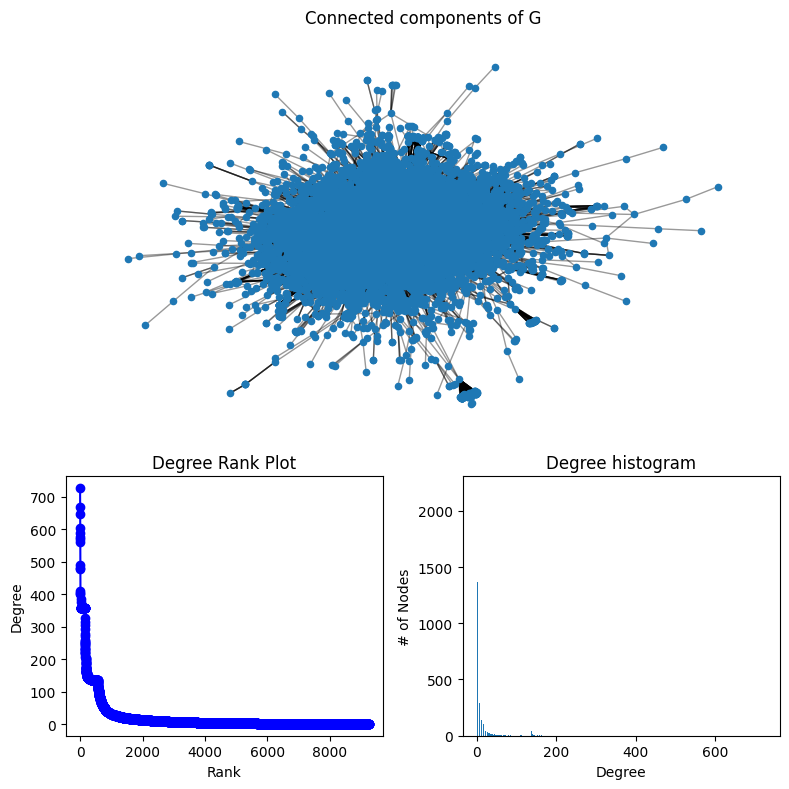

In [17]:
#Degree analysis: For directed graph it's the full graph -> no connected
degree_sequence = sorted((d for n, d in G.degree()), reverse=True)
dmax = max(degree_sequence)

fig = plt.figure("Degree of a random graph", figsize=(8, 8))
# Create a gridspec for adding subplots of different sizes
axgrid = fig.add_gridspec(5, 4)

ax0 = fig.add_subplot(axgrid[0:3, :])
Gcc = G.subgraph(sorted(networkx.connected_components(G), key=len, reverse=True)[0])
pos = networkx.spring_layout(Gcc, seed=10396953)
networkx.draw_networkx_nodes(Gcc, pos, ax=ax0, node_size=20)
networkx.draw_networkx_edges(Gcc, pos, ax=ax0, alpha=0.4)
ax0.set_title("Connected components of G")
ax0.set_axis_off()

ax1 = fig.add_subplot(axgrid[3:, :2])
ax1.plot(degree_sequence, "b-", marker="o")
ax1.set_title("Degree Rank Plot")
ax1.set_ylabel("Degree")
ax1.set_xlabel("Rank")

ax2 = fig.add_subplot(axgrid[3:, 2:])
ax2.bar(*np.unique(degree_sequence, return_counts=True))
ax2.set_title("Degree histogram")
ax2.set_xlabel("Degree")
ax2.set_ylabel("# of Nodes")

fig.tight_layout()
plt.show()

### As a multidigraph in NetworkX
Directed multigraph

In [12]:
G = networkx.from_pandas_edgelist(
    dOMNIpath,
    source="source_genesymbol", target="target_genesymbol",
    edge_key = "pathway",
    create_using=networkx.MultiDiGraph())
G

In [13]:
print(f"Edges:{G.number_of_edges()}, Nodes:{G.number_of_nodes()}, Avg Degree:{sum(dict(G.degree()).values())/G.number_of_nodes()}")
print("We have this many isolates: ", 
        networkx.number_of_isolates(G))

Edges:94836, Nodes:9248, Avg Degree:20.509515570934255
We have this many isolates:  0


In [14]:
compute_hierarchy(G)

0.7821087846894166

# Embedding the KG

Use a KGE approach that takes into account directionality and multimodality


In [20]:
from pykeen.pipeline import pipeline
from pykeen.triples import TriplesFactory

In [21]:
dOMNIpath.shape

(94836, 3)

In [22]:
tf = TriplesFactory.from_labeled_triples(
        dOMNIpath.to_numpy(dtype="str"),create_inverse_triples=False)
tf

TriplesFactory(num_entities=9248, num_relations=34, create_inverse_triples=False, num_triples=94836)

In [23]:
import json
with open(f"{data_dir}/omnipath_KGEtransr_entityIDS.json","w") as outf:
    json.dump(tf.entity_id_to_label, outf)

with open(f"{data_dir}/omnipath_KGEtransr_relationIDS.json","w") as outf:
    json.dump(tf.relation_id_to_label, outf)

In [24]:
modelKGE = "omnipath_50_unstratified_stopped_TransR"

In [25]:
import pykeen

pykeen.env()

| Key             | Value                    |
|-----------------|--------------------------|
| OS              | posix                    |
| Platform        | Linux                    |
| Release         | 6.2.11-300.fc38.x86_64   |
| Time            | Fri Apr 21 09:38:37 2023 |
| Python          | 3.9.16                   |
| PyKEEN          | 1.10.1                   |
| PyKEEN Hash     | UNHASHED                 |
| PyKEEN Branch   |                          |
| PyTorch         | 2.0.0                    |
| CUDA Available? | true                     |
| CUDA Version    | 11.8                     |
| cuDNN Version   | 8700                     |


In [26]:
torch.has_cuda

True

using automatically assigned random_state=1072096221


Training epochs on cuda:0:   0%|          | 0/72 [00:00<?, ?epoch/s]

Training batches on cuda:0:   0%|          | 0/297 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/297 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/297 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/297 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/297 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/297 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/297 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/297 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/297 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/297 [00:00<?, ?batch/s]

INFO:pykeen.evaluation.evaluator:Starting batch_size search for evaluation now...
INFO:pykeen.evaluation.evaluator:Concluded batch_size search with batch_size=512.
INFO:pykeen.evaluation.evaluator:Evaluation took 2.88s seconds
INFO:pykeen.stoppers.early_stopping:New best result at epoch 10: 0.2624420075917335. Saved model weights to /var/home/ferran/.data/pykeen/checkpoints/best-model-weights-471c4755-27d3-4388-9e93-2d973bef3aa0.pt
INFO:pykeen.training.training_loop:=> Saved checkpoint after having finished epoch 10.


Training batches on cuda:0:   0%|          | 0/297 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/297 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/297 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/297 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/297 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/297 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/297 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/297 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/297 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/297 [00:00<?, ?batch/s]

INFO:pykeen.evaluation.evaluator:Evaluation took 2.89s seconds
INFO:pykeen.stoppers.early_stopping:New best result at epoch 20: 0.28885491353859133. Saved model weights to /var/home/ferran/.data/pykeen/checkpoints/best-model-weights-471c4755-27d3-4388-9e93-2d973bef3aa0.pt
INFO:pykeen.training.training_loop:=> Saved checkpoint after having finished epoch 20.


Training batches on cuda:0:   0%|          | 0/297 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/297 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/297 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/297 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/297 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/297 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/297 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/297 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/297 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/297 [00:00<?, ?batch/s]

INFO:pykeen.evaluation.evaluator:Evaluation took 2.93s seconds


Training batches on cuda:0:   0%|          | 0/297 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/297 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/297 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/297 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/297 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/297 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/297 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/297 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/297 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/297 [00:00<?, ?batch/s]

INFO:pykeen.evaluation.evaluator:Evaluation took 2.93s seconds
INFO:pykeen.stoppers.early_stopping:New best result at epoch 40: 0.2973428932939688. Saved model weights to /var/home/ferran/.data/pykeen/checkpoints/best-model-weights-471c4755-27d3-4388-9e93-2d973bef3aa0.pt
INFO:pykeen.training.training_loop:=> Saved checkpoint after having finished epoch 40.


Training batches on cuda:0:   0%|          | 0/297 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/297 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/297 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/297 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/297 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/297 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/297 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/297 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/297 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/297 [00:00<?, ?batch/s]

INFO:pykeen.evaluation.evaluator:Evaluation took 2.88s seconds
INFO:pykeen.stoppers.early_stopping:New best result at epoch 50: 0.3028258118937157. Saved model weights to /var/home/ferran/.data/pykeen/checkpoints/best-model-weights-471c4755-27d3-4388-9e93-2d973bef3aa0.pt
INFO:pykeen.training.training_loop:=> Saved checkpoint after having finished epoch 50.


Training batches on cuda:0:   0%|          | 0/297 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/297 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/297 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/297 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/297 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/297 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/297 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/297 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/297 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/297 [00:00<?, ?batch/s]

INFO:pykeen.evaluation.evaluator:Evaluation took 2.96s seconds


Training batches on cuda:0:   0%|          | 0/297 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/297 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/297 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/297 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/297 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/297 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/297 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/297 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/297 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/297 [00:00<?, ?batch/s]

INFO:pykeen.evaluation.evaluator:Evaluation took 2.86s seconds
INFO:pykeen.stoppers.early_stopping:Stopping early at epoch 70. The best result 0.3028258118937157 occurred at epoch 50.
INFO:pykeen.stoppers.early_stopping:Re-loading weights from best epoch from /var/home/ferran/.data/pykeen/checkpoints/best-model-weights-471c4755-27d3-4388-9e93-2d973bef3aa0.pt


Evaluating on cuda:0:   0%|          | 0.00/9.48k [00:00<?, ?triple/s]

INFO:pykeen.evaluation.evaluator:Evaluation took 3.08s seconds
INFO:pykeen.triples.triples_factory:Stored TriplesFactory(num_entities=9248, num_relations=34, create_inverse_triples=False, num_triples=75868) to file:///var/home/ferran/PhD/yaleCollab/KGEs/omnipath_50_unstratified_stopped_TransR/training_triples
INFO:pykeen.pipeline.api:Saved to directory: file:///var/home/ferran/PhD/yaleCollab/KGEs/omnipath_50_unstratified_stopped_TransR


TransR(
  (loss): MarginRankingLoss(
    (margin_activation): ReLU()
  )
  (interaction): TransRInteraction()
  (entity_representations): ModuleList(
    (0): Embedding(
      (_embeddings): Embedding(9248, 50)
    )
  )
  (relation_representations): ModuleList(
    (0): Embedding(
      (_embeddings): Embedding(34, 30)
    )
    (1): Embedding(
      (_embeddings): Embedding(34, 1500)
    )
  )
  (weight_regularizers): ModuleList()
)
CPU times: user 32min 27s, sys: 47.8 s, total: 33min 14s
Wall time: 4min 39s


<Axes: title={'center': 'Early Stopper Evaluation Plot'}, xlabel='Epoch', ylabel='hits_at_k'>

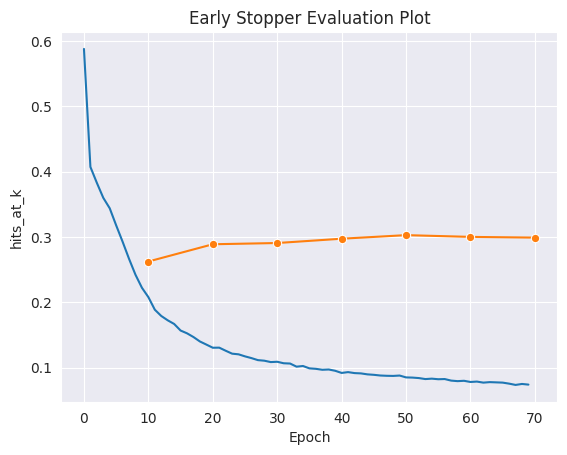

In [27]:
%%time

training, testing, validation = tf.split([.8, .1, .1])

result = pipeline(
    training=training,
    testing=testing,
    validation=validation,
    model="TransR",
    model_kwargs=dict(embedding_dim=50),
    training_loop='sLCWA',
    negative_sampler='basic',
    stopper="early",
    random_seed=42,
    epochs=72,  # short epochs for testing - you should go
                # higher, especially with early stopper enabled
                
)

# result.save_to_directory(f"{kge_dir}/one50_unstratified_stopped_transe")
result.save_to_directory(f"{kge_dir}/{modelKGE}")

#model used TransE has only one representation for entities and relations, 
# so modules objects will be of length 1
print(result.model)
result.plot_losses()
result.plot_early_stopping()

In [28]:
try:
    trained_model = torch.load(f"{kge_dir}/{modelKGE}/trained_model.pkl")
except RuntimeError:
    trained_model = torch.load(f"{kge_dir}/{modelKGE}/trained_model.pkl",
    map_location=torch.device("cpu"))

print(trained_model)

TransR(
  (loss): MarginRankingLoss(
    (margin_activation): ReLU()
  )
  (interaction): TransRInteraction()
  (entity_representations): ModuleList(
    (0): Embedding(
      (_embeddings): Embedding(9248, 50)
    )
  )
  (relation_representations): ModuleList(
    (0): Embedding(
      (_embeddings): Embedding(34, 30)
    )
    (1): Embedding(
      (_embeddings): Embedding(34, 1500)
    )
  )
  (weight_regularizers): ModuleList()
)


## Metadata


In [29]:
import json
with open(f"{data_dir}/omnipath_KGEtransr_entityIDS.json") as infile:
    entityIDS = json.load(infile)

with open(f"{data_dir}/omnipath_KGEtransr_relationIDS.json") as infile:
    relationIDS = json.load(infile)

In [30]:
PathDict = pd.read_csv(f"{data_dir}/DBs/ReactomePathways.txt", sep="\t", header=None)
PathDict = PathDict.loc[PathDict[2]=="Homo sapiens",[0,1]].drop_duplicates()
PathDict = PathDict.set_index([0]).to_dict()[1]
# PathDict

In [31]:
#Metadata
mdPath2Path = pd.read_csv(f"{data_dir}/DBs/ReactomePathwaysRelation.txt", sep="\t", header=None)
mdPath2Path = mdPath2Path.loc[mdPath2Path[0].isin([
                "R-HSA-162582",#Signal transduction
                "R-HSA-5357801",#Programmed cell death
                "R-HSA-73894",#DNA repair
                "R-HSA-8953897",#Cell response to stress
                "R-HSA-1500931",#Cell-cell commns
                "R-HSA-1640170"#Cell cycle
                                                    ])].drop_duplicates()
mdPath2Path = mdPath2Path.replace(PathDict)
mdPath2Path = mdPath2Path.loc[mdPath2Path[1].isin(relationIDS.values())]
mdPath2Path = mdPath2Path.set_index([1]).reindex(index=relationIDS.values()).fillna(value="LR").reset_index()
mdPath2Path.head()

,1,0
0,Apoptosis,Programmed Cell Death
1,Base Excision Repair,DNA Repair
2,Cell Cycle Checkpoints,Cell Cycle
3,"Cell Cycle, Mitotic",Cell Cycle
4,Cell junction organization,Cell-Cell communication


In [32]:
mdEntities = pd.DataFrame(columns=["entity","pathway"])
for i in entityIDS.values():
    if any(mdPathPE.obj[2].str.contains(i)):
        for n in mdPathPE.obj.loc[mdPathPE.obj[2].str.contains(i)][5].unique():
            row = pd.Series({"entity":i, "pathway":n})
            mdEntities = pd.concat([mdEntities, row.to_frame().T])
    else:
        row = pd.Series({"entity":i})
        mdEntities = pd.concat([mdEntities, row.to_frame().T])
            
mdEntities = mdEntities.loc[mdEntities["pathway"].isin(relationIDS.values()) | mdEntities["pathway"].isna()] #Get only pathways wecare about from pur entity list
mdEntities["1stPathways"] = mdEntities["pathway"].map(mdPath2Path.set_index([1]).to_dict()[0])    
mdEntities


,entity,pathway,1stPathways
0,A1BG,NaN,NaN
0,A2M,NaN,NaN
0,AAAS_AHCTF1_GLE1_NDC1_NUP107_NUP133_NUP153_NUP...,NaN,NaN
0,AAK1,NaN,NaN
0,AANAT,NaN,NaN
...,...,...,...
0,ZWINT,"Cell Cycle, Mitotic",Cell Cycle
0,ZWINT,Cell Cycle Checkpoints,Cell Cycle
0,ZWINT,"Signaling by Rho GTPases, Miro GTPases and RHO...",Signal Transduction
0,ZXDC,NaN,NaN


In [33]:
#Add entity type metadata
mdEntities["Sources"] = mdEntities["entity"].isin(dOMNIpath["source_genesymbol"])
mdEntities["Targets"] = mdEntities["entity"].isin(dOMNIpath["target_genesymbol"])
# #DOES NOT WORK WITH PANDAS BELOW 1.5 (and collab env has 1.3.5....)
# mdEntities["EntityType"] = pd.from_dummies(mdEntities[["Ligands","Receptors","PTMs"]])
mdEntities

,entity,pathway,1stPathways,Sources,Targets
0,A1BG,NaN,NaN,False,True
0,A2M,NaN,NaN,True,True
0,AAAS_AHCTF1_GLE1_NDC1_NUP107_NUP133_NUP153_NUP...,NaN,NaN,True,True
0,AAK1,NaN,NaN,True,True
0,AANAT,NaN,NaN,True,True
...,...,...,...,...,...
0,ZWINT,"Cell Cycle, Mitotic",Cell Cycle,False,True
0,ZWINT,Cell Cycle Checkpoints,Cell Cycle,False,True
0,ZWINT,"Signaling by Rho GTPases, Miro GTPases and RHO...",Signal Transduction,False,True
0,ZXDC,NaN,NaN,False,True


### Nodes

In [34]:
#Construct nodes dataframe: detach() for now is meaningless as compute is CPU
entity_embeddings = trained_model.entity_representations[0](indices=None).detach().cpu().numpy()
dKGEnodes_50 = pd.DataFrame(entity_embeddings, index=entityIDS.values())
dKGEnodes_50

,0,1,2,3,4,5,6,7,8,9,...,40,41,42,43,44,45,46,47,48,49
A1BG,0.168749,-0.115078,-0.284815,0.136267,0.050776,-0.195221,-0.011114,-0.001942,-0.091480,-0.115033,...,-0.136144,0.191162,0.059513,0.043871,-0.132613,-0.154810,-0.245956,-0.150547,-0.031841,-0.115345
A2M,-0.171674,-0.064670,0.052996,-0.068624,-0.046354,-0.098046,0.236560,-0.013534,0.178363,0.015394,...,-0.093867,0.081763,-0.159688,0.097931,-0.028741,-0.020183,0.184809,-0.319230,-0.163206,0.006041
AAAS_AHCTF1_GLE1_NDC1_NUP107_NUP133_NUP153_NUP155_NUP160_NUP188_NUP205_NUP210_NUP214_NUP35_NUP37_NUP42_NUP43_NUP50_NUP54_NUP58_NUP62_NUP85_NUP88_NUP93_NUP98_POM121_RAE1_RANBP2_SEC13_SEH1L_TPR,0.016916,0.059035,0.081082,-0.051270,-0.126972,-0.185547,-0.195467,-0.174221,-0.022048,0.094809,...,-0.020118,0.084224,-0.223350,-0.093606,-0.115414,0.313520,0.007840,0.234518,0.090897,-0.023346
AAK1,-0.031832,-0.069830,-0.120497,0.013276,0.250261,0.226753,-0.163884,0.122832,0.145507,0.152419,...,0.212164,0.209348,-0.271362,-0.065723,0.129874,0.074858,0.180683,-0.129777,-0.131210,0.223652
AANAT,-0.050789,0.026697,0.032373,0.296229,-0.148040,-0.011147,0.016159,-0.175297,0.105730,-0.031381,...,-0.116404,-0.079715,0.167580,-0.172420,0.039863,-0.206487,-0.300214,-0.209653,0.190827,-0.094137
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
ZSWIM2,0.218658,0.068080,-0.205122,-0.118409,0.054787,0.024513,-0.144079,0.199494,-0.065039,-0.057872,...,-0.136822,0.252353,-0.101827,0.114271,-0.150328,0.009771,0.036610,0.143896,0.043302,0.081284
ZW10,-0.081173,0.091789,-0.031350,0.059798,-0.179222,0.032429,-0.029622,0.056066,-0.197992,0.138027,...,-0.082527,-0.241609,0.006250,0.056161,0.196974,0.197980,0.066818,-0.136562,0.156254,0.074561
ZWINT,0.162270,-0.055928,-0.063938,-0.123214,-0.104072,-0.087757,0.048259,0.065016,-0.080204,-0.157709,...,-0.146367,0.122455,-0.063385,0.058995,0.067579,0.225262,0.020177,0.198606,0.032809,-0.048729
ZXDC,-0.032551,-0.044964,-0.132640,0.072477,0.133302,-0.162599,-0.057085,0.259096,-0.052903,0.041053,...,-0.027811,0.236141,-0.095779,0.074155,-0.177789,-0.189098,-0.088654,0.084450,0.094621,0.093738


In [35]:
l_and_r = pd.Series(entityIDS.values()).isin((mdEntities.loc[mdEntities["Sources"]==True,"entity"])) & pd.Series(entityIDS.values()).isin((mdEntities.loc[mdEntities["Targets"]==True,"entity"]))
print(l_and_r.describe())
l_and_r
# l_and_r_mask = np.array([0]*len(nodes))
# l_and_r_mask[l_and_r] = 1

count      9248
unique        2
top       False
freq       5130
dtype: object


0       False
1        True
2        True
3        True
4        True
        ...  
9243    False
9244    False
9245    False
9246    False
9247     True
Length: 9248, dtype: bool

In [36]:
deg = dict(networkx.degree(G))
deg = pd.DataFrame((deg.keys(), deg.values())).T
deg.set_index(0, inplace=True)
deg = deg.loc[np.array(G.nodes())].reindex(entityIDS.values())
deg[1] = deg[1].astype(float)
logdeg = deg.copy(deep=True)
logdeg[1] = np.log10(logdeg[1]) #NP.log needs floats and can't take in int.
deg[1] = deg[1].astype(int)
print(deg.describe())
print(logdeg.describe())
deg

                 1
count  9248.000000
mean     20.509516
std      56.380140
min       1.000000
25%       2.000000
50%       4.000000
75%      11.000000
max     726.000000
                 1
count  9248.000000
mean      0.697277
std       0.631675
min       0.000000
25%       0.301030
50%       0.602060
75%       1.041393
max       2.860937


,1
0,
A1BG,2
A2M,8
AAAS_AHCTF1_GLE1_NDC1_NUP107_NUP133_NUP153_NUP155_NUP160_NUP188_NUP205_NUP210_NUP214_NUP35_NUP37_NUP42_NUP43_NUP50_NUP54_NUP58_NUP62_NUP85_NUP88_NUP93_NUP98_POM121_RAE1_RANBP2_SEC13_SEH1L_TPR,3
AAK1,11
AANAT,5
...,...
ZSWIM2,139
ZW10,1
ZWINT,4


## DR on KGE

In [37]:
from sklearn.decomposition import PCA

dKGEn_pca = PCA(n_components=2).fit_transform(dKGEnodes_50)
dKGEn_pca = pd.DataFrame(dKGEn_pca, index=entityIDS.values())

/var/home/ferran/miniconda3/envs/collab_cuda/lib/python3.9/site-packages/scprep/plot/utils.py:104: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/var/home/ferran/miniconda3/envs/collab_cuda/lib/python3.9/site-packages/scprep/plot/utils.py:104: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()


<Axes: title={'center': 'KGE nodes (col=Degree)'}, xlabel='PC-1', ylabel='PC-2'>

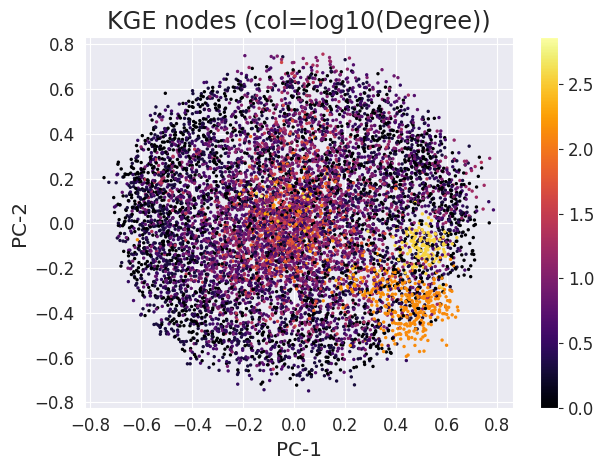

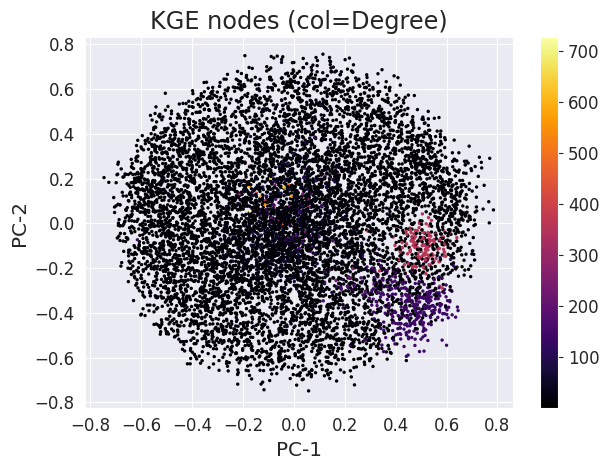

In [38]:
scprep.plot.scatter2d(dKGEn_pca,
    c=logdeg, #cmap_scale = "log", SCALE STUCK AT BOTTOM BLACK END
    title="KGE nodes (col=log10(Degree))", label_prefix="PC-", 
    legend_loc=(1.05, 0), shuffle=True,
    dpi=480)
scprep.plot.scatter2d(dKGEn_pca,
    c=deg, #cmap_scale = "log", SCALE STUCK AT BOTTOM BLACK END
    title="KGE nodes (col=Degree)", label_prefix="PC-", 
    legend_loc=(1.05, 0), shuffle=True,
    dpi=480)

/var/home/ferran/miniconda3/envs/collab_cuda/lib/python3.9/site-packages/scprep/plot/utils.py:104: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/var/home/ferran/miniconda3/envs/collab_cuda/lib/python3.9/site-packages/scprep/plot/utils.py:104: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/var/home/ferran/miniconda3/envs/collab_cuda/lib/python3.9/site-packages/scprep/plot/utils.py:104: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()


<Axes: title={'center': 'Ligands and Receptors'}, xlabel='PC-1', ylabel='PC-2'>

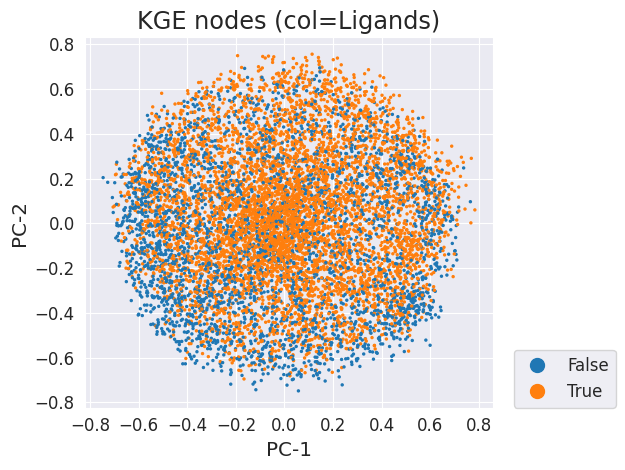

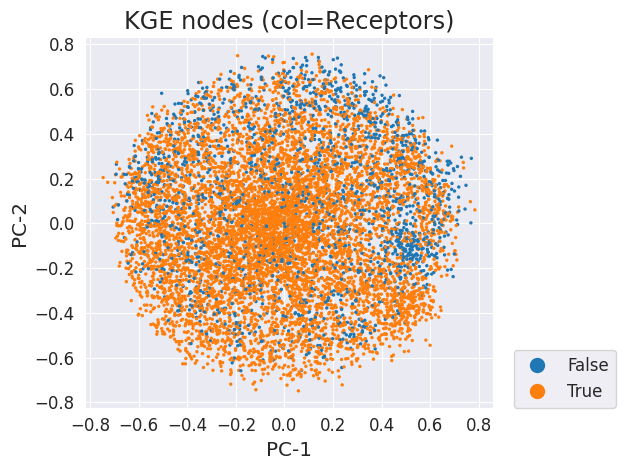

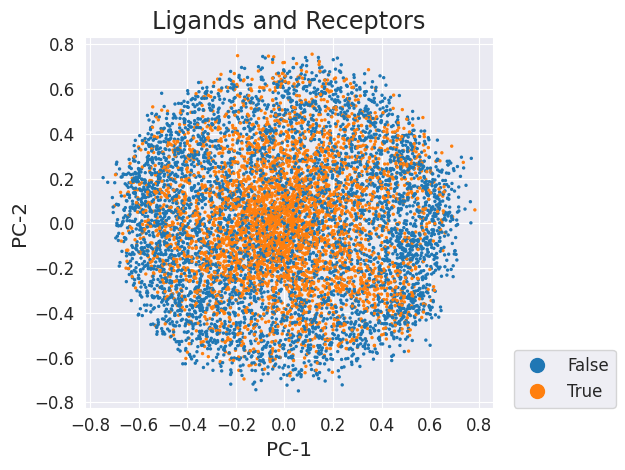

In [39]:
scprep.plot.scatter2d(dKGEn_pca,
    c=dKGEn_pca.index.isin(mdEntities.loc[mdEntities["Sources"]==True, "entity"]),
    title="KGE nodes (col=Ligands)", label_prefix="PC-", 
    legend_loc=(1.05, 0), shuffle=True,
    dpi=480)
scprep.plot.scatter2d(dKGEn_pca,
    c=dKGEn_pca.index.isin(mdEntities.loc[mdEntities["Targets"]==True, "entity"]),
    title="KGE nodes (col=Receptors)", label_prefix="PC-", 
    legend_loc=(1.05, 0), shuffle=True,
    dpi=480)
scprep.plot.scatter2d(dKGEn_pca,
    c=l_and_r,
    title="Ligands and Receptors", label_prefix="PC-", 
    legend_loc=(1.05, 0), shuffle=True,
    dpi=480)

/var/home/ferran/miniconda3/envs/collab_cuda/lib/python3.9/site-packages/scprep/plot/utils.py:104: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/var/home/ferran/miniconda3/envs/collab_cuda/lib/python3.9/site-packages/scprep/plot/utils.py:104: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/var/home/ferran/miniconda3/envs/collab_cuda/lib/python3.9/site-packages/scprep/plot/utils.py:104: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/var/home/ferran/miniconda3/envs/collab_cuda/lib/python3.9/site-packages/scprep/plot/utils.py:104: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
 

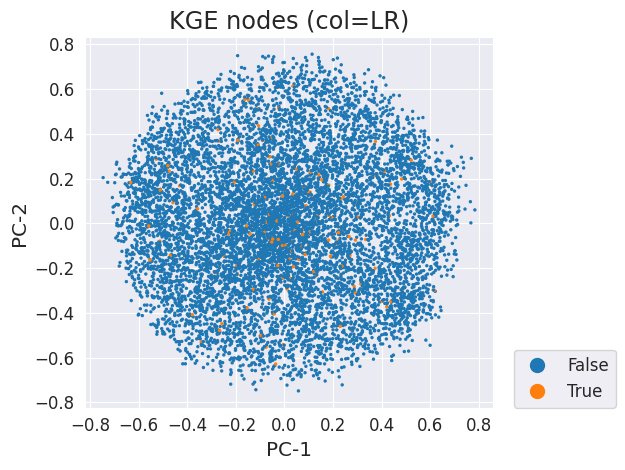

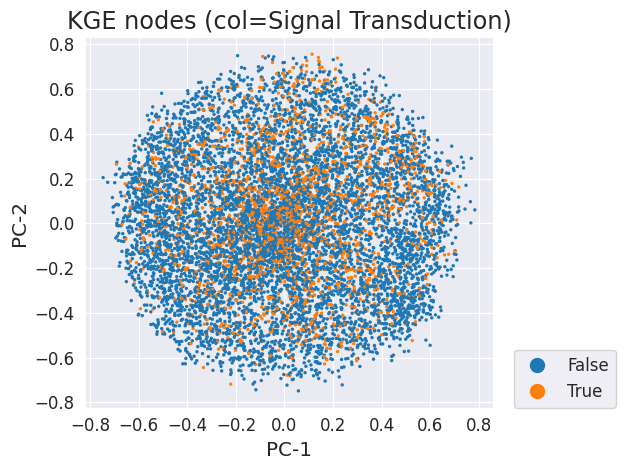

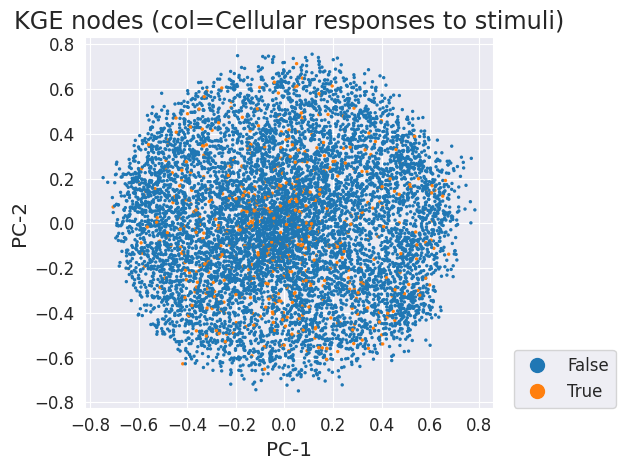

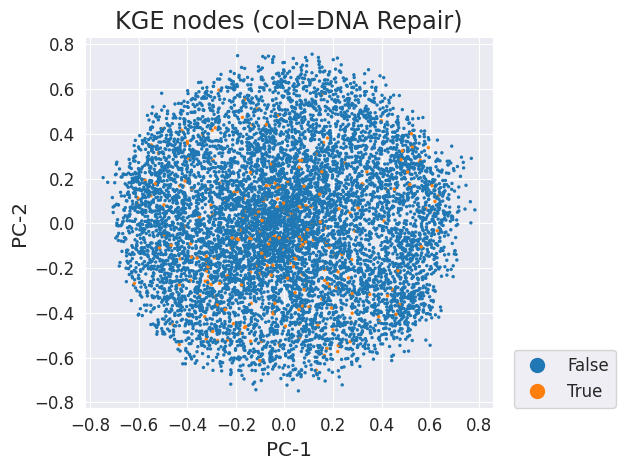

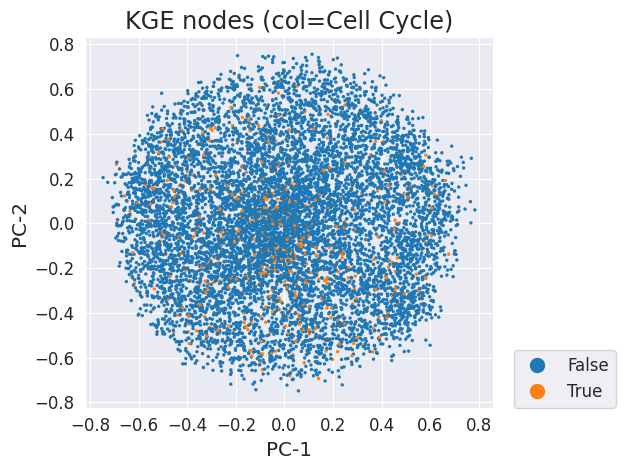

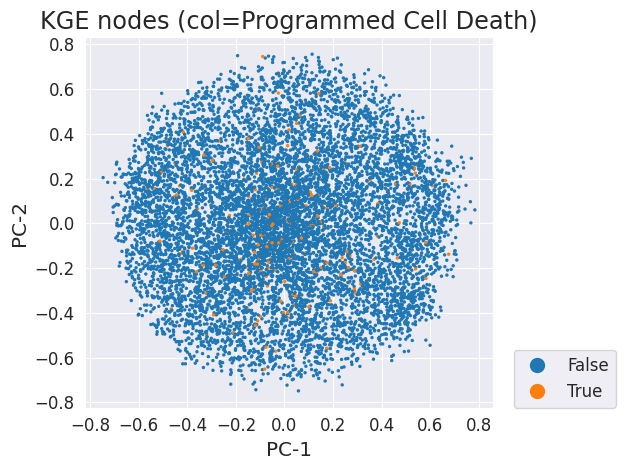

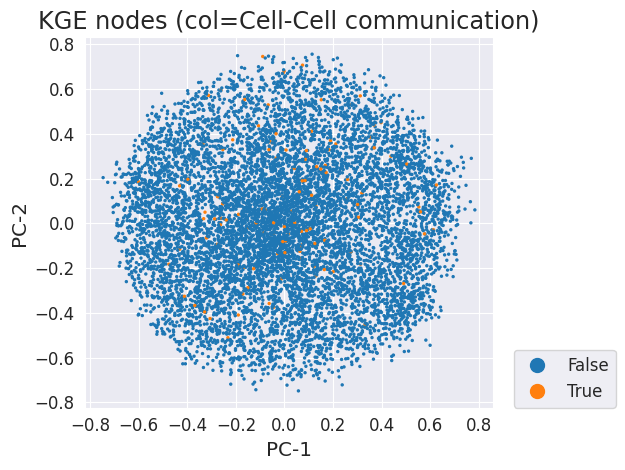

In [40]:
for i in mdEntities["1stPathways"].dropna().unique():
    scprep.plot.scatter2d(dKGEn_pca,
        c=dKGEn_pca.index.isin(mdEntities.loc[mdEntities["1stPathways"]==i, "entity"]),
        title=f"KGE nodes (col={i})", label_prefix="PC-", 
        legend_loc=(1.05, 0), shuffle=True,
        dpi=480)

In [41]:
dKGEn_phate = phate.PHATE().fit_transform(dKGEnodes_50)
dKGEn_phate = pd.DataFrame(dKGEn_phate, index=entityIDS.values())

Calculating PHATE...
  Running PHATE on 9248 observations and 50 variables.
  Calculating graph and diffusion operator...
    Calculating KNN search...
    Calculated KNN search in 8.85 seconds.
    Calculating affinities...
    Calculated affinities in 0.48 seconds.
  Calculated graph and diffusion operator in 9.35 seconds.
  Calculating landmark operator...
    Calculating SVD...
    Calculated SVD in 0.86 seconds.
    Calculating KMeans...
    Calculated KMeans in 9.58 seconds.
  Calculated landmark operator in 12.08 seconds.
  Calculating optimal t...
    Automatically selected t = 15
  Calculated optimal t in 2.98 seconds.
  Calculating diffusion potential...
  Calculated diffusion potential in 1.32 seconds.
  Calculating metric MDS...
  Calculated metric MDS in 7.66 seconds.
Calculated PHATE in 33.41 seconds.


/var/home/ferran/miniconda3/envs/collab_cuda/lib/python3.9/site-packages/scprep/plot/utils.py:104: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/var/home/ferran/miniconda3/envs/collab_cuda/lib/python3.9/site-packages/scprep/plot/utils.py:104: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()


<Axes: title={'center': 'KGE nodes (col=Degree)'}, xlabel='Phate-1', ylabel='Phate-2'>

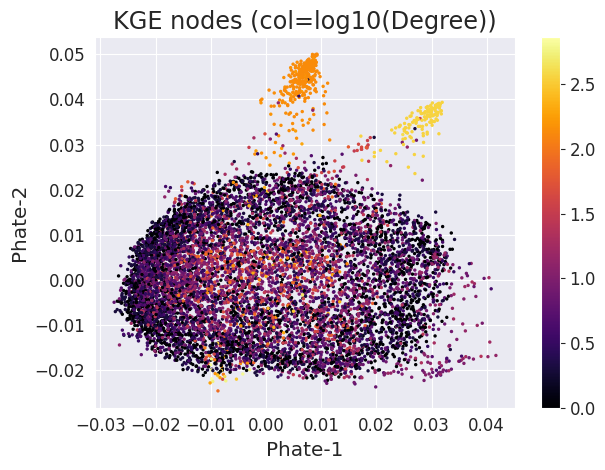

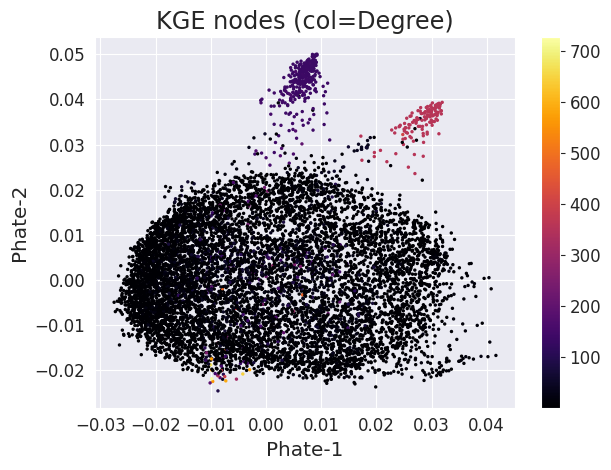

In [42]:
scprep.plot.scatter2d(dKGEn_phate,
    c=logdeg, #cmap_scale = "log", SCALE STUCK AT BOTTOM BLACK END
    title="KGE nodes (col=log10(Degree))", label_prefix="Phate-", 
    legend_loc=(1.05, 0), shuffle=True,
    dpi=480)
scprep.plot.scatter2d(dKGEn_phate,
    c=deg, #cmap_scale = "log", SCALE STUCK AT BOTTOM BLACK END
    title="KGE nodes (col=Degree)", label_prefix="Phate-", 
    legend_loc=(1.05, 0), shuffle=True,
    dpi=480)

/var/home/ferran/miniconda3/envs/collab_cuda/lib/python3.9/site-packages/scprep/plot/utils.py:104: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/var/home/ferran/miniconda3/envs/collab_cuda/lib/python3.9/site-packages/scprep/plot/utils.py:104: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/var/home/ferran/miniconda3/envs/collab_cuda/lib/python3.9/site-packages/scprep/plot/utils.py:104: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()


<Axes: title={'center': 'Ligands and Receptors'}, xlabel='Phate-1', ylabel='Phate-2'>

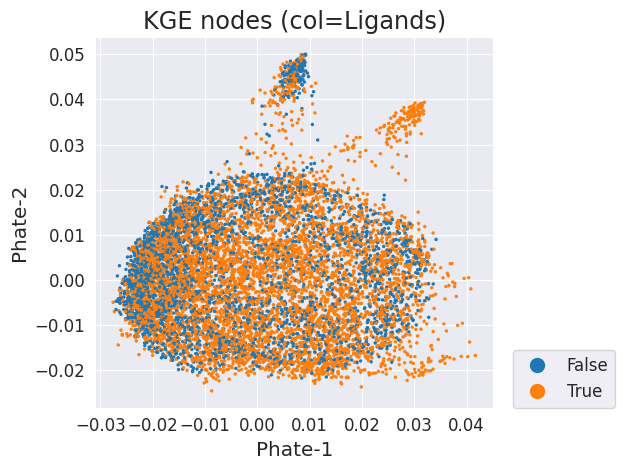

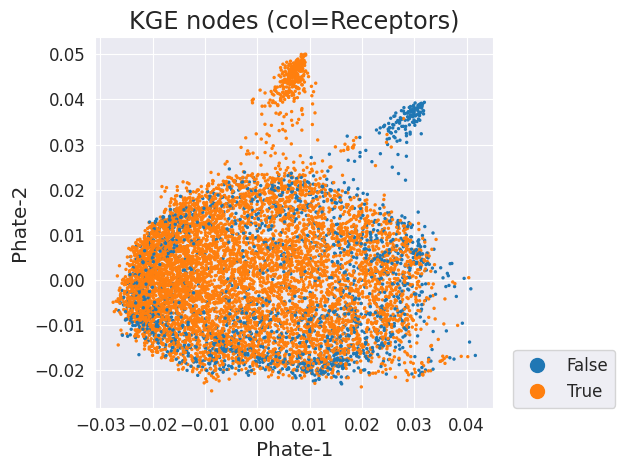

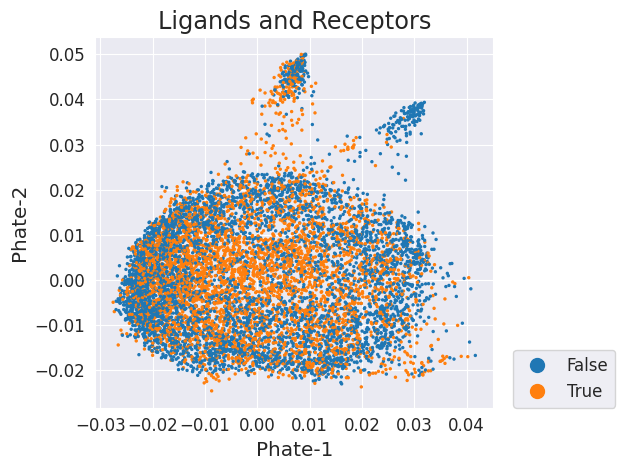

In [43]:
scprep.plot.scatter2d(dKGEn_phate,
    c=dKGEn_phate.index.isin(mdEntities.loc[mdEntities["Sources"]==True, "entity"]),
    title="KGE nodes (col=Ligands)", label_prefix="Phate-", 
    legend_loc=(1.05, 0), shuffle=True,
    dpi=480)
scprep.plot.scatter2d(dKGEn_phate,
    c=dKGEn_phate.index.isin(mdEntities.loc[mdEntities["Targets"]==True, "entity"]),
    title="KGE nodes (col=Receptors)", label_prefix="Phate-", 
    legend_loc=(1.05, 0), shuffle=True,
    dpi=480)
scprep.plot.scatter2d(dKGEn_phate,
    c=l_and_r,
    title="Ligands and Receptors", label_prefix="Phate-", 
    legend_loc=(1.05, 0), shuffle=True,
    dpi=480)

/var/home/ferran/miniconda3/envs/collab_cuda/lib/python3.9/site-packages/scprep/plot/utils.py:104: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/var/home/ferran/miniconda3/envs/collab_cuda/lib/python3.9/site-packages/scprep/plot/utils.py:104: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/var/home/ferran/miniconda3/envs/collab_cuda/lib/python3.9/site-packages/scprep/plot/utils.py:104: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/var/home/ferran/miniconda3/envs/collab_cuda/lib/python3.9/site-packages/scprep/plot/utils.py:104: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
 

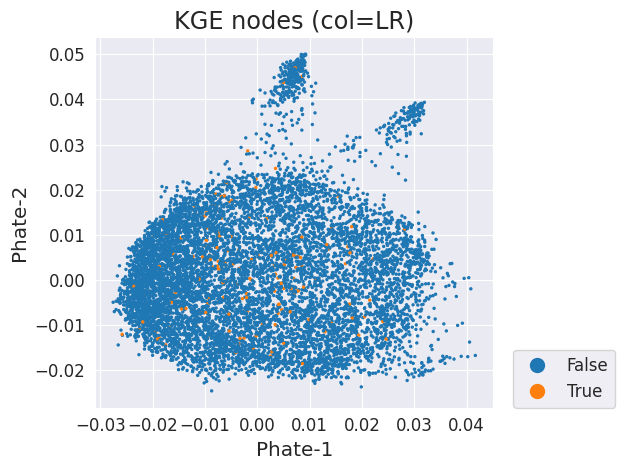

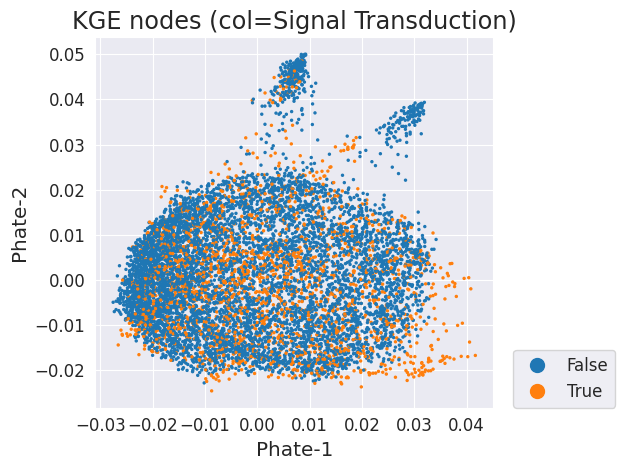

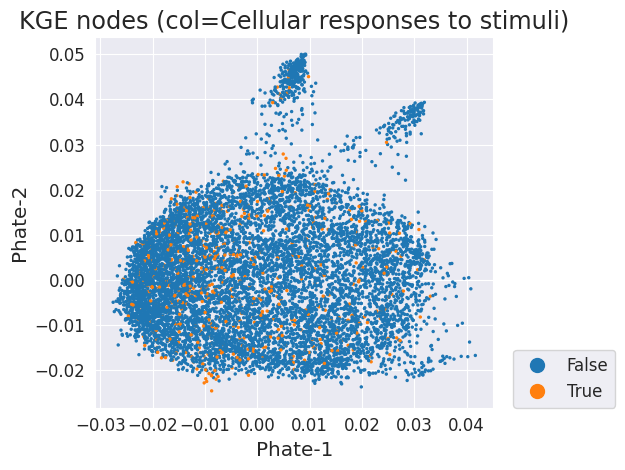

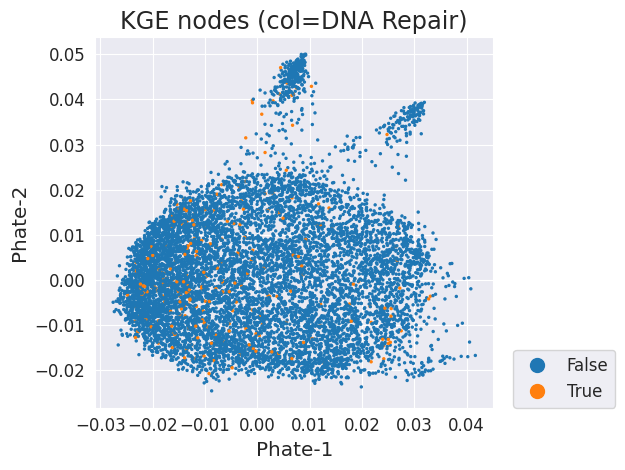

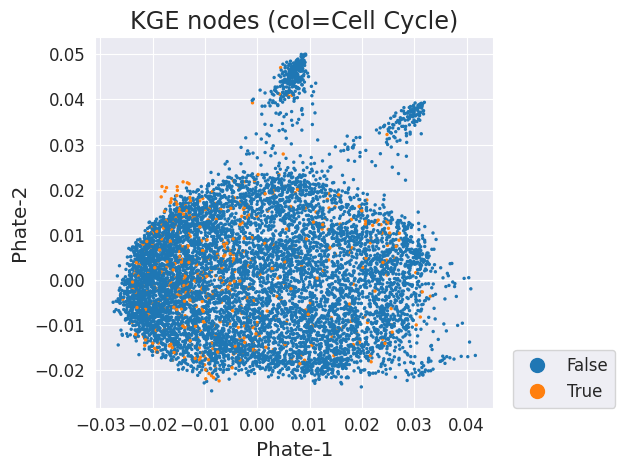

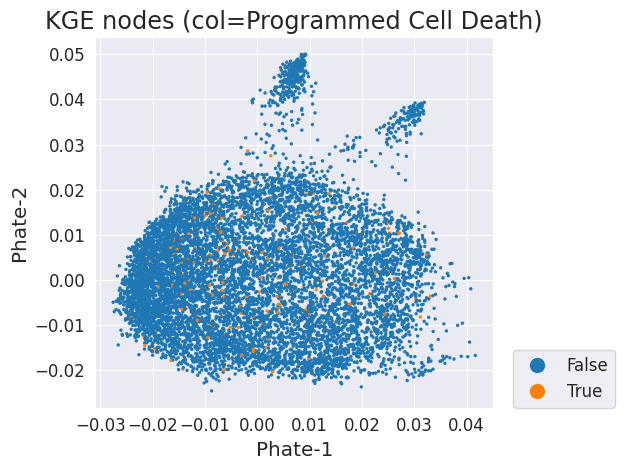

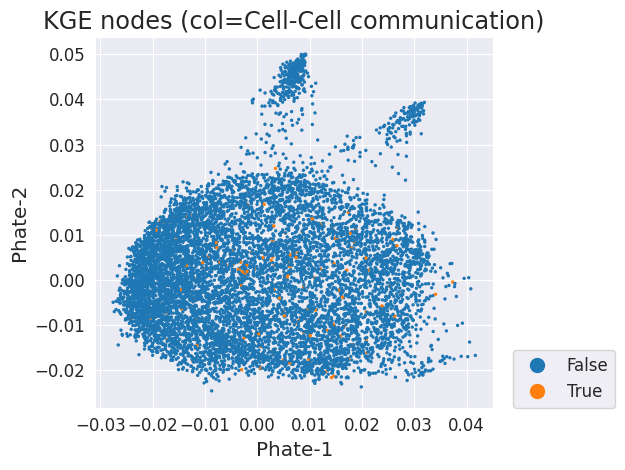

In [44]:
for i in mdEntities["1stPathways"].dropna().unique():
    scprep.plot.scatter2d(dKGEn_phate,
        c=dKGEn_phate.index.isin(mdEntities.loc[mdEntities["1stPathways"]==i, "entity"]),
        title=f"KGE nodes (col={i})", label_prefix="Phate-", 
        legend_loc=(1.05, 0), shuffle=True,
        dpi=480)

In [45]:
list(mdPath2Path.loc[mdPath2Path[0]=="Signal Transduction",1])

['Integrin signaling',
 'Intracellular signaling by second messengers',
 'MAPK family signaling cascades',
 'MTOR signalling',
 'Signaling by Erythropoietin',
 'Signaling by GPCR',
 'Signaling by Hedgehog',
 'Signaling by Hippo',
 'Signaling by Leptin',
 'Signaling by NOTCH',
 'Signaling by Non-Receptor Tyrosine Kinases',
 'Signaling by Nuclear Receptors',
 'Signaling by Receptor Tyrosine Kinases',
 'Signaling by Rho GTPases, Miro GTPases and RHOBTB3',
 'Signaling by TGFB family members',
 'Signaling by WNT']

/var/home/ferran/miniconda3/envs/collab_cuda/lib/python3.9/site-packages/scprep/plot/utils.py:104: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/var/home/ferran/miniconda3/envs/collab_cuda/lib/python3.9/site-packages/scprep/plot/utils.py:104: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/var/home/ferran/miniconda3/envs/collab_cuda/lib/python3.9/site-packages/scprep/plot/utils.py:104: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/var/home/ferran/miniconda3/envs/collab_cuda/lib/python3.9/site-packages/scprep/plot/utils.py:104: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
 

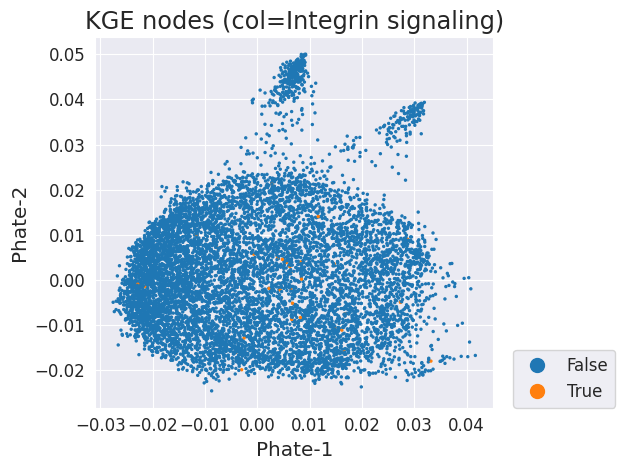

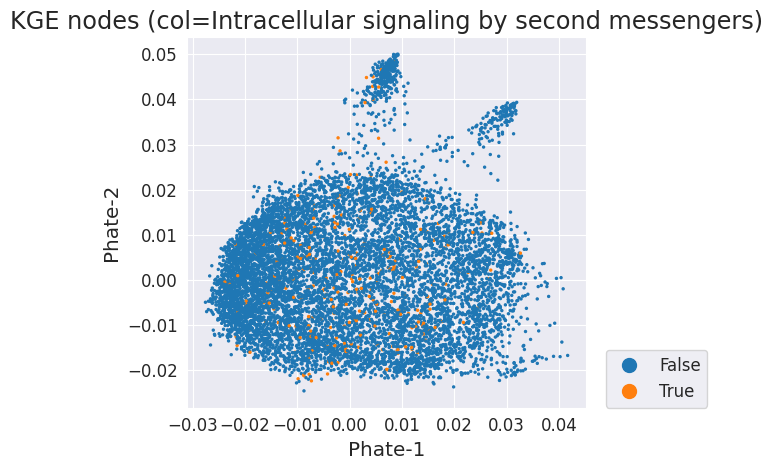

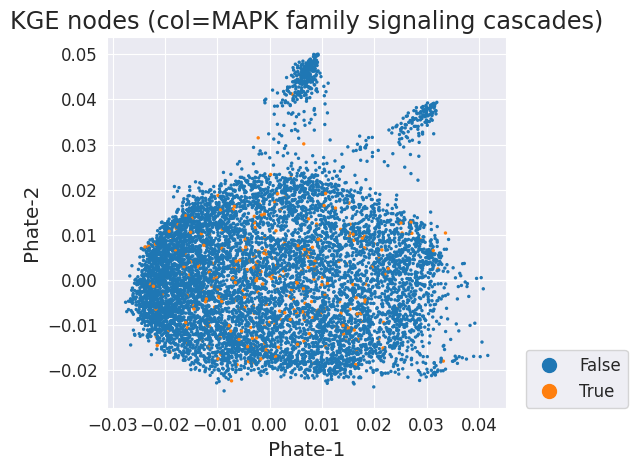

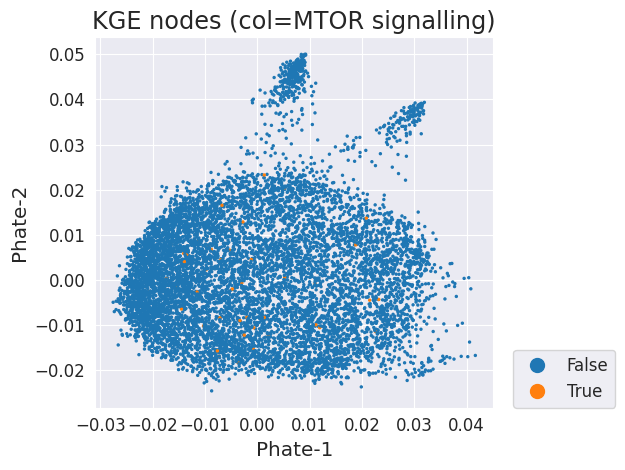

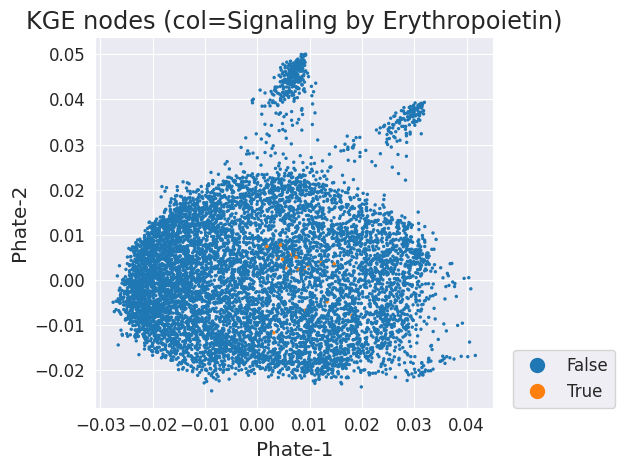

...

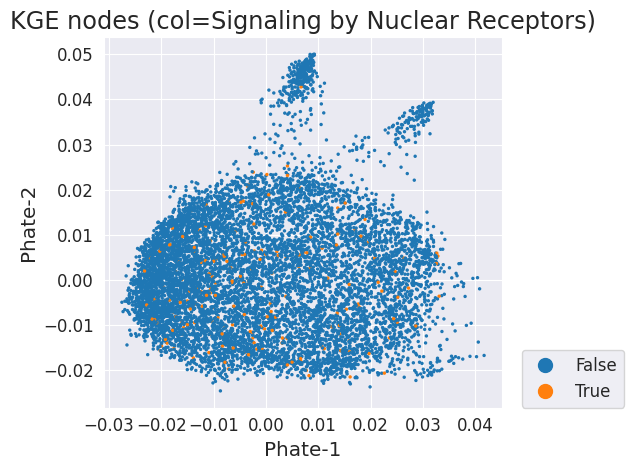

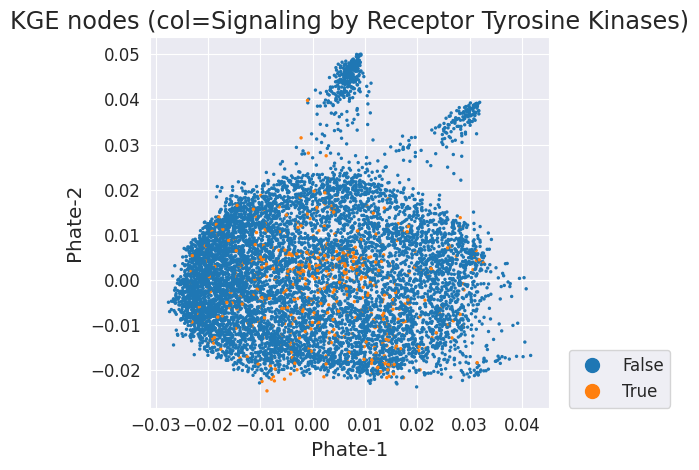

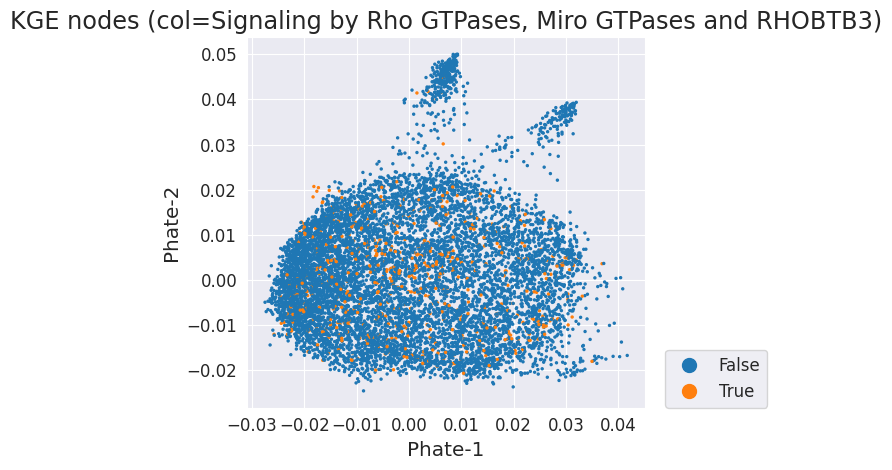

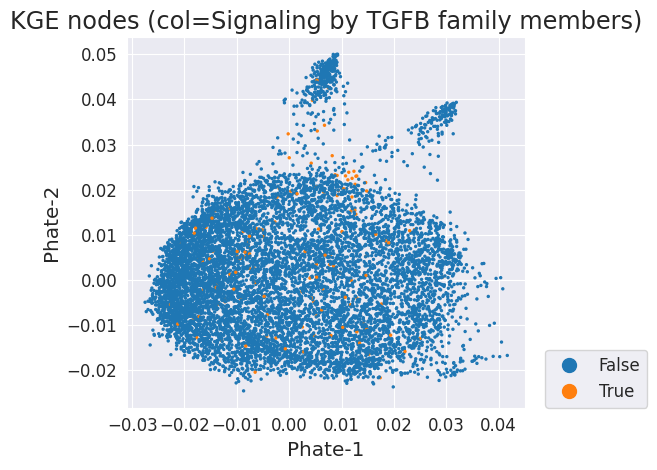

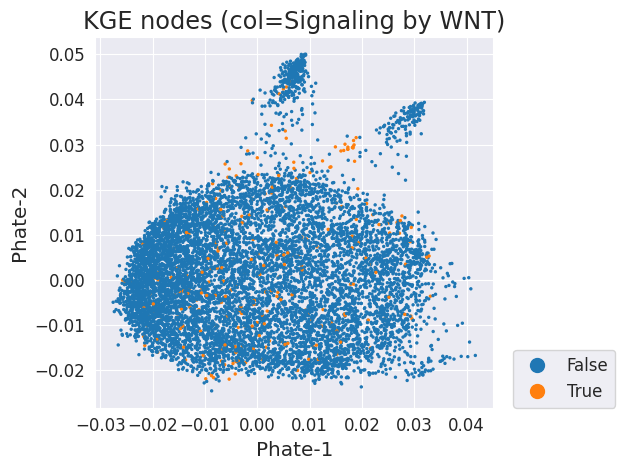

In [46]:
for i in mdPath2Path.loc[mdPath2Path[0]=="Signal Transduction",1]:
    scprep.plot.scatter2d(dKGEn_phate,
        c=dKGEn_phate.index.isin(mdEntities.loc[mdEntities["pathway"]==i, "entity"]),
        title=f"KGE nodes (col={i})", label_prefix="Phate-", 
        legend_loc=(1.05, 0), shuffle=True,
        dpi=480)

## Edge metadata



In [47]:
trained_model.relation_representations[0](indices=None).detach().cpu().numpy().shape

(34, 30)

In [48]:
relationIDS.values()

dict_values(['Apoptosis', 'Base Excision Repair', 'Cell Cycle Checkpoints', 'Cell Cycle, Mitotic', 'Cell junction organization', 'Cellular responses to stress', 'Chromosome Maintenance', 'DNA Damage Bypass', 'DNA Double-Strand Break Repair', 'Death Receptor Signaling', 'Fanconi Anemia Pathway', 'Integrin signaling', 'Intracellular signaling by second messengers', 'MAPK family signaling cascades', 'MTOR signalling', 'Meiosis', 'Mismatch Repair', 'Nephrin family interactions', 'Nucleotide Excision Repair', 'Regulated Necrosis', 'Signal regulatory protein family interactions', 'Signaling by Erythropoietin', 'Signaling by GPCR', 'Signaling by Hedgehog', 'Signaling by Hippo', 'Signaling by Leptin', 'Signaling by NOTCH', 'Signaling by Non-Receptor Tyrosine Kinases', 'Signaling by Nuclear Receptors', 'Signaling by Receptor Tyrosine Kinases', 'Signaling by Rho GTPases, Miro GTPases and RHOBTB3', 'Signaling by TGFB family members', 'Signaling by WNT', 'undetermined'])

In [49]:
#Construct edges dataframe
relation_embeddings = trained_model.relation_representations[0](indices=None).detach().cpu().numpy()
dKGEedges_50 = pd.DataFrame(relation_embeddings, index=relationIDS.values())
dKGEedges_50

,0,1,2,3,4,5,6,7,8,9,...,20,21,22,23,24,25,26,27,28,29
Apoptosis,0.253006,-0.000874,-0.249393,0.236913,-0.156096,-0.012681,0.243987,0.004223,-0.017152,-0.249803,...,-0.148255,-0.155592,-0.159476,-0.269123,-0.011053,0.001972,-0.010607,0.189041,-0.007647,0.005785
Base Excision Repair,-0.117233,-0.018447,0.123938,-0.227880,-0.106360,-0.092426,-0.126931,-0.046138,-0.000885,0.253051,...,0.143802,-0.262158,0.202106,0.097218,-0.265099,0.016632,-0.099141,-0.094225,0.259065,0.022654
Cell Cycle Checkpoints,0.019547,-0.011194,-0.245407,0.013289,-0.197970,0.175321,0.006121,-0.005411,0.030311,0.285994,...,0.230715,0.238196,0.000649,-0.283993,-0.210198,0.211633,-0.160114,-0.238563,0.028805,0.235693
"Cell Cycle, Mitotic",0.263796,0.037804,-0.025670,-0.016757,-0.012490,0.157735,-0.194975,-0.173870,0.206157,-0.011653,...,0.219686,-0.224064,-0.230700,0.223565,-0.237787,0.000254,-0.008005,0.232943,0.236486,-0.197022
Cell junction organization,0.006841,0.016344,-0.053717,-0.007689,0.008060,0.303599,-0.234612,-0.027581,0.029074,-0.023454,...,0.265592,-0.007342,0.322759,-0.269434,0.259396,-0.324924,0.027210,-0.034378,0.201925,0.034665
Cellular responses to stress,0.020798,-0.007526,0.249133,0.010568,0.005749,0.018585,-0.246201,0.002665,-0.269281,0.179572,...,-0.024768,-0.229901,0.015040,0.285653,-0.215965,-0.198205,0.274064,0.005680,0.009267,0.008510
Chromosome Maintenance,-0.021407,-0.315701,-0.040460,0.131979,0.313604,0.014831,-0.160980,-0.009556,0.292759,0.054688,...,0.115849,0.002987,-0.296799,0.004355,-0.228665,-0.077535,-0.005609,-0.007101,0.301693,0.005582
DNA Damage Bypass,0.210531,-0.003397,0.046943,-0.100974,-0.006818,0.300584,0.036197,-0.025000,0.343995,-0.004433,...,-0.015733,0.029230,-0.247137,-0.170438,0.161546,0.023623,-0.248597,-0.205970,-0.013712,-0.307637
DNA Double-Strand Break Repair,0.095584,-0.225797,0.286057,0.177101,0.004844,0.017655,-0.312705,-0.048464,0.026868,0.031462,...,0.200721,-0.031539,0.013667,-0.285852,-0.024279,0.007011,0.188278,-0.013393,0.190410,0.183846
Death Receptor Signaling,-0.012731,0.234259,0.212083,-0.233584,-0.171868,-0.243892,-0.241983,-0.161332,0.050496,0.287192,...,-0.275829,-0.012727,-0.263224,-0.019183,-0.173001,-0.258336,0.003350,0.207961,0.281576,0.012379


### PCA

In [50]:
from sklearn.decomposition import PCA

dKGEe_pca = PCA(n_components=2).fit_transform(dKGEedges_50)
dKGEe_pca = pd.DataFrame(dKGEe_pca, index=relationIDS.values())

In [51]:
mdPath2Path.set_index([1]).reindex(relationIDS.values())

,0
1,
Apoptosis,Programmed Cell Death
Base Excision Repair,DNA Repair
Cell Cycle Checkpoints,Cell Cycle
"Cell Cycle, Mitotic",Cell Cycle
Cell junction organization,Cell-Cell communication
Cellular responses to stress,Cellular responses to stimuli
Chromosome Maintenance,Cell Cycle
DNA Damage Bypass,DNA Repair
DNA Double-Strand Break Repair,DNA Repair


/var/home/ferran/miniconda3/envs/collab_cuda/lib/python3.9/site-packages/scprep/plot/utils.py:99: UserWarning: Tight layout not applied. The left and right margins cannot be made large enough to accommodate all axes decorations.
  fig.tight_layout()
/var/home/ferran/miniconda3/envs/collab_cuda/lib/python3.9/site-packages/scprep/plot/utils.py:104: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/var/home/ferran/miniconda3/envs/collab_cuda/lib/python3.9/site-packages/scprep/plot/utils.py:104: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()


<Axes: title={'center': 'Edges'}, xlabel='PC-1', ylabel='PC-2'>

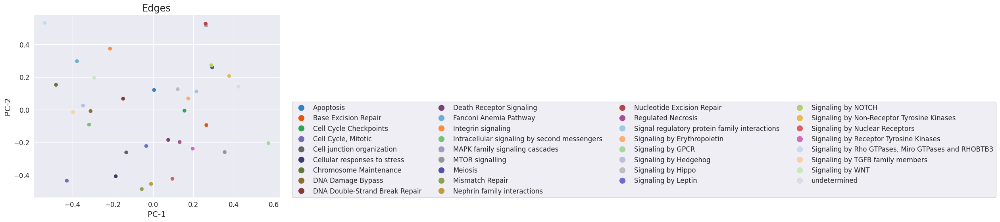

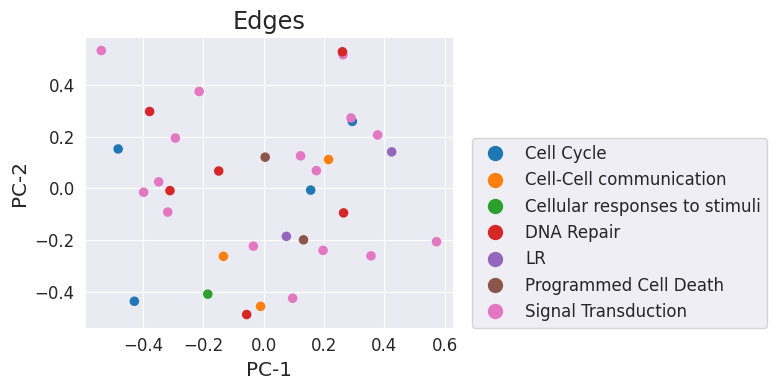

In [52]:
scprep.plot.scatter2d(dKGEe_pca,
    c=dKGEe_pca.index,
    title="Edges", label_prefix="PC-", 
    legend_loc=(1.05, 0), shuffle=True,
    figsize=(8, 6),dpi=480)
scprep.plot.scatter2d(dKGEe_pca,
    c=mdPath2Path.set_index([1]).reindex(relationIDS.values()),
    title="Edges", label_prefix="PC-", 
    legend_loc=(1.05, 0), shuffle=True,
    figsize=(8, 4),dpi=480)

### PHATE

In [53]:
dKGEe_phate = phate.PHATE().fit_transform(dKGEedges_50)
dKGEe_phate = pd.DataFrame(dKGEe_phate, index=relationIDS.values())

Calculating PHATE...
  Running PHATE on 34 observations and 30 variables.
  Calculating graph and diffusion operator...
    Calculating KNN search...
    Calculating affinities...
  Calculated graph and diffusion operator in 0.01 seconds.
  Calculating optimal t...
    Automatically selected t = 12
  Calculating diffusion potential...
  Calculating metric MDS...
Calculated PHATE in 0.03 seconds.


/var/home/ferran/miniconda3/envs/collab_cuda/lib/python3.9/site-packages/scprep/plot/utils.py:99: UserWarning: Tight layout not applied. The left and right margins cannot be made large enough to accommodate all axes decorations.
  fig.tight_layout()
/var/home/ferran/miniconda3/envs/collab_cuda/lib/python3.9/site-packages/scprep/plot/utils.py:104: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/var/home/ferran/miniconda3/envs/collab_cuda/lib/python3.9/site-packages/scprep/plot/utils.py:104: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()


<Axes: title={'center': 'Edges'}, xlabel='PHATE-1', ylabel='PHATE-2'>

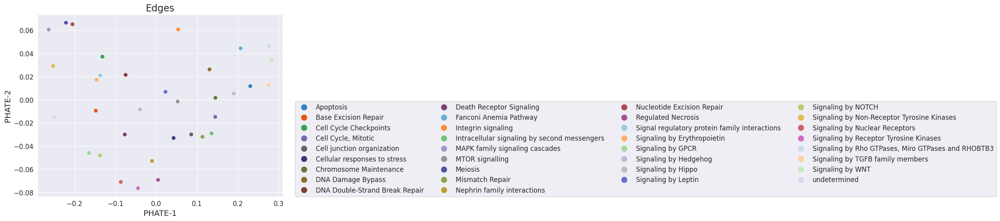

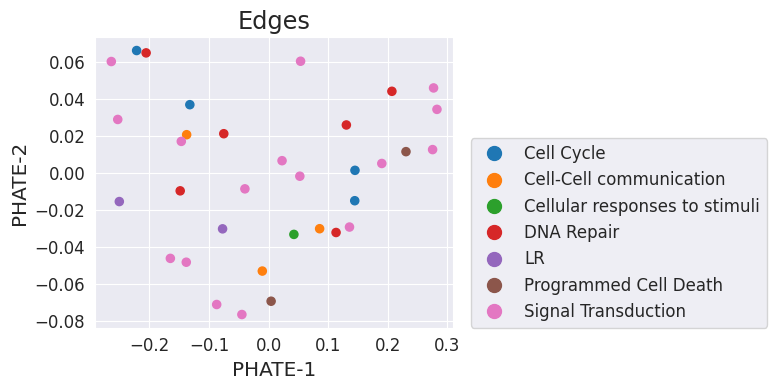

In [54]:
scprep.plot.scatter2d(dKGEe_phate,
    c=dKGEe_phate.index,
    title="Edges", label_prefix="PHATE-", 
    legend_loc=(1.05, 0), shuffle=True,
    figsize=(8, 6),dpi=480)
scprep.plot.scatter2d(dKGEe_phate,
    c=mdPath2Path.set_index([1]).reindex(relationIDS.values()),
    title="Edges", label_prefix="PHATE-", 
    legend_loc=(1.05, 0), shuffle=True,
    figsize=(8, 4),dpi=480)